### Necessary Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from IPython.display import display, HTML
import seaborn as sns
%matplotlib inline

### Reading the csv files

In [35]:
car_data = pd.read_excel(r"Data/InsuranceData/Carfeatures.xlsx", index_col=0)
# policy_features = pd.read_excel(r"Data/InsuranceData/Policy features.xlsx", index_col=0)
insurance_claim = pd.read_excel(r"Data/InsuranceData/Insurance claim.xlsx", index_col=0)

In [36]:
# Merging the two dataframes on the policy_id columns
data = pd.merge(car_data, insurance_claim, on="policy_id", how="inner")

In [37]:
display(data.head(5))

,make,segment,model,fuel_type,max_torque,max_power,engine_type,airbags,is_esc,is_adjustable_steering,...,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim
policy_id,,,,,,,,,,,,,,,,,,,,,
ID00001,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2.0,No,No,...,No,No,No,Yes,No,No,No,Yes,0,0
ID00002,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2.0,No,No,...,No,No,No,Yes,No,No,No,Yes,0,0
ID00003,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2.0,No,No,...,No,No,No,Yes,No,No,No,Yes,0,0
ID00004,1,C1,M2,Petrol,113Nm@4400rpm,88.50bhp@6000rpm,1.2 L K12N Dualjet,2.0,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,2,0
ID00005,2,A,M3,Petrol,91Nm@4250rpm,67.06bhp@5500rpm,1.0 SCe,2.0,No,No,...,No,Yes,Yes,Yes,No,Yes,Yes,Yes,2,0


In [38]:
data.reset_index(inplace=True)

data.columns

Index(['policy_id', 'make', 'segment', 'model', 'fuel_type', 'max_torque',
       'max_power', 'engine_type', 'airbags', 'is_esc',
       'is_adjustable_steering', 'is_tpms', 'is_parking_sensors',
       'is_parking_camera', 'rear_brakes_type', 'displacement', 'cylinder',
       'transmission_type', 'gear_box', 'steering_type', 'turning_radius',
       'length', 'width', 'height', 'gross_weight', 'is_front_fog_lights',
       'is_rear_window_wiper', 'is_rear_window_washer',
       'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks',
       'is_central_locking', 'is_power_steering',
       'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror',
       'is_ecw', 'is_speed_alert', 'ncap_rating', 'is_claim'],
      dtype='object')

In [39]:
data.shape

(58515, 39)

In [40]:
# Dropping all the duplicate entries
data.drop_duplicates(inplace=True)

In [41]:
data.isna().sum()

policy_id                            0
make                                 0
segment                              0
model                                0
fuel_type                           26
max_torque                           7
max_power                            3
engine_type                          3
airbags                              9
is_esc                               3
is_adjustable_steering               7
is_tpms                              3
is_parking_sensors                   7
is_parking_camera                    3
rear_brakes_type                     0
displacement                         7
cylinder                             7
transmission_type                    0
gear_box                             0
steering_type                        0
turning_radius                       0
length                               0
width                                0
height                               0
gross_weight                         0
is_front_fog_lights      

In [42]:
# Since mostly cars that have the same make, segment, model are going to have the same value for the other NULL values
# So the idea is to impute everything else with the mode of the rest of the values
# Getting all the columns those have null values
null_cols = [i for i in data.columns if data[i].isna().sum() >= 1]
grouped = data.groupby(['make', 'segment', 'model'])

# Step 3 & 4: Calculate the mode and fill NaN values
def fill_mode(group):
    # Calculate mode for each column within the group
    for column in null_cols:
        mode_value = group[column].mode()
        if not mode_value.empty:
            # Fill NaN with the mode value
            group[column] = group[column].fillna(mode_value.iloc[0])
    return group

# Apply the function to each group
df = grouped.apply(fill_mode, include_groups=False)

In [48]:
df.reset_index(inplace=True)
df.drop(columns=["level_3"], inplace=True)

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58515 entries, 0 to 58514
Data columns (total 39 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   make                              58515 non-null  int64  
 1   segment                           58515 non-null  object 
 2   model                             58515 non-null  object 
 3   policy_id                         58515 non-null  object 
 4   fuel_type                         58515 non-null  object 
 5   max_torque                        58515 non-null  object 
 6   max_power                         58515 non-null  object 
 7   engine_type                       58515 non-null  object 
 8   airbags                           58515 non-null  float64
 9   is_esc                            58515 non-null  object 
 10  is_adjustable_steering            58515 non-null  object 
 11  is_tpms                           58515 non-null  object 
 12  is_p

### Cleaning up the dataset

1. Let's convert the max_torque column and split it into Nm and rpm
2. Let's convert the max_power column here and also split the same

In [50]:
# Extracting the numerical part before 'Nm'
df['max_torque_nm'] = df['max_torque'].str.extract(r'(\d+)Nm').astype(int)
# Extracting RPM values from the 'max_torque' column
df['rpm_max_torque'] = df['max_torque'].str.extract(r'@(\d+)rpm').astype(int)
# Extracting the numerical part before 'Nm'
df['max_power_bhp'] = df['max_power'].str.extract(r'(\d+)bhp').astype(int)
# Extracting RPM values from the 'max_power' column
df['rpm_max_power'] = df['max_power'].str.extract(r'@(\d+)rpm').astype(int)

df.drop(columns=["max_power", "max_torque"], inplace=True)

In [51]:
df.head(5)

,make,segment,model,policy_id,fuel_type,engine_type,airbags,is_esc,is_adjustable_steering,is_tpms,...,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim,max_torque_nm,rpm_max_torque,max_power_bhp,rpm_max_power
0,1,A,M1,ID00001,CNG,F8D Petrol Engine,2.0,No,No,No,...,No,No,No,Yes,0,0,60,3500,36,6000
1,1,A,M1,ID00002,CNG,F8D Petrol Engine,2.0,No,No,No,...,No,No,No,Yes,0,0,60,3500,36,6000
2,1,A,M1,ID00003,CNG,F8D Petrol Engine,2.0,No,No,No,...,No,No,No,Yes,0,0,60,3500,36,6000
3,1,A,M1,ID00011,CNG,F8D Petrol Engine,2.0,No,No,No,...,No,No,No,Yes,0,0,60,3500,36,6000
4,1,A,M1,ID00015,CNG,F8D Petrol Engine,2.0,No,No,No,...,No,No,No,Yes,0,0,60,3500,36,6000


Let's seperate out the numeric and non numeric columns f

In [53]:
df.columns

Index(['make', 'segment', 'model', 'policy_id', 'fuel_type', 'engine_type',
       'airbags', 'is_esc', 'is_adjustable_steering', 'is_tpms',
       'is_parking_sensors', 'is_parking_camera', 'rear_brakes_type',
       'displacement', 'cylinder', 'transmission_type', 'gear_box',
       'steering_type', 'turning_radius', 'length', 'width', 'height',
       'gross_weight', 'is_front_fog_lights', 'is_rear_window_wiper',
       'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist',
       'is_power_door_locks', 'is_central_locking', 'is_power_steering',
       'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror',
       'is_ecw', 'is_speed_alert', 'ncap_rating', 'is_claim', 'max_torque_nm',
       'rpm_max_torque', 'max_power_bhp', 'rpm_max_power'],
      dtype='object')

In [100]:
non_numeric = [i for i in df.columns if df[i].dtype == "object"]
numeric = [i for i in df.columns if i not in non_numeric]
true_numeric = ['max_torque_nm', 'rpm_max_torque', 'max_power_bhp', 'rpm_max_power', 'displacement', 'turning_radius', 'length', 'width', 'height', 'gross_weight']

In [101]:
numeric.remove("is_claim")
non_numeric.remove("policy_id")

### Getting a basic overview of the dataset

In [56]:
profile = ProfileReport(df, title="Profiling Report for car data")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\amvishnoi\AppData\Local\anaconda3\envs\general\Lib\site-packages\ydata_profiling\model\typeset.py:208: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  is_valid_dtype = pdt.is_categorical_dtype(series) and not pdt.is_bool_dtype(
c:\Users\amvishnoi\AppData\Local\anaconda3\envs\general\Lib\site-packages\ydata_profiling\model\typeset_relations.py:34: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pdt.is_categorical_dtype(series):
c:\Users\amvishnoi\AppData\Local\anaconda3\envs\general\Lib\site-packages\ydata_profiling\model\typeset.py:208: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  is_valid_dtype = pdt.is_categorical_dtype(series) and not pdt.is_bool_dtype(
c:\Users\amvishno

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [141]:
yes_no_dict = {1: "Yes", 0: "No"}
zero_one_dict = {"Yes": 1, "No": 0}

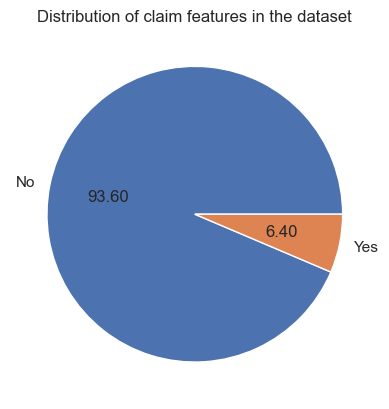

In [58]:
# Checking the imbalance in the dataset
# fig, ax = plt.subplots()
target = df.groupby("is_claim").size()
plt.pie(list(target.values), labels=[yes_no_dict[i] for i in target.index], autopct="%.2f")
plt.title("Distribution of claim features in the dataset")
plt.show()

Clearly there is an imbalance in the dataset for the same

Checking for outliers in the dataset

In [59]:
df.columns

Index(['make', 'segment', 'model', 'policy_id', 'fuel_type', 'engine_type',
       'airbags', 'is_esc', 'is_adjustable_steering', 'is_tpms',
       'is_parking_sensors', 'is_parking_camera', 'rear_brakes_type',
       'displacement', 'cylinder', 'transmission_type', 'gear_box',
       'steering_type', 'turning_radius', 'length', 'width', 'height',
       'gross_weight', 'is_front_fog_lights', 'is_rear_window_wiper',
       'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist',
       'is_power_door_locks', 'is_central_locking', 'is_power_steering',
       'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror',
       'is_ecw', 'is_speed_alert', 'ncap_rating', 'is_claim', 'max_torque_nm',
       'rpm_max_torque', 'max_power_bhp', 'rpm_max_power'],
      dtype='object')

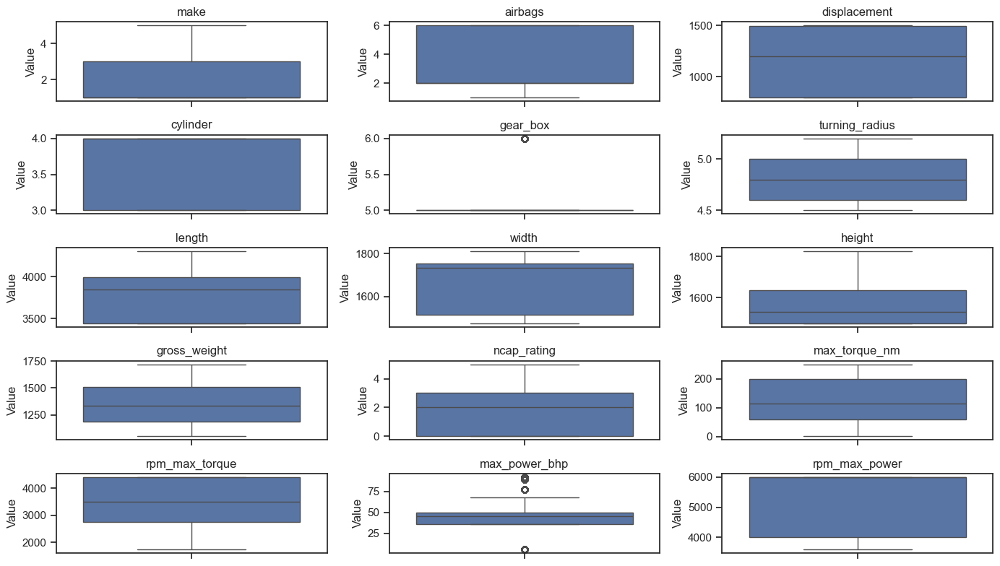

In [63]:
fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(14, 8))
axs = axs.flatten()

for i, column in enumerate(df[numeric].columns):
    sns.boxplot(df[column], ax=axs[i])
    axs[i].set_title(column)
    axs[i].set_ylabel('Value')
plt.tight_layout()
plt.show()

There seems to be no outliers in the dataset except for one value in the gear box let's analyse the same

In [ ]:
df["gear_box"].value_counts() 
# This seems to be normal as there are only two 

gear_box
5    44161
6    14354
Name: count, dtype: int64

In [66]:
# Let's also check for the values for max_power_bhp seems like there are some values that looks like outliers here
df["max_power_bhp"].value_counts()

max_power_bhp
50    17776
36    15297
45    13991
92     4168
6      2366
89     2111
77     1598
68     1208
Name: count, dtype: int64

Since this is a lot of fraction of values, this can't be the outlier there might be some old cards that have only this much max_power_bhp, futher analysis is needed

Let's plot the sns pairplot to check out the distribution of various type of data values

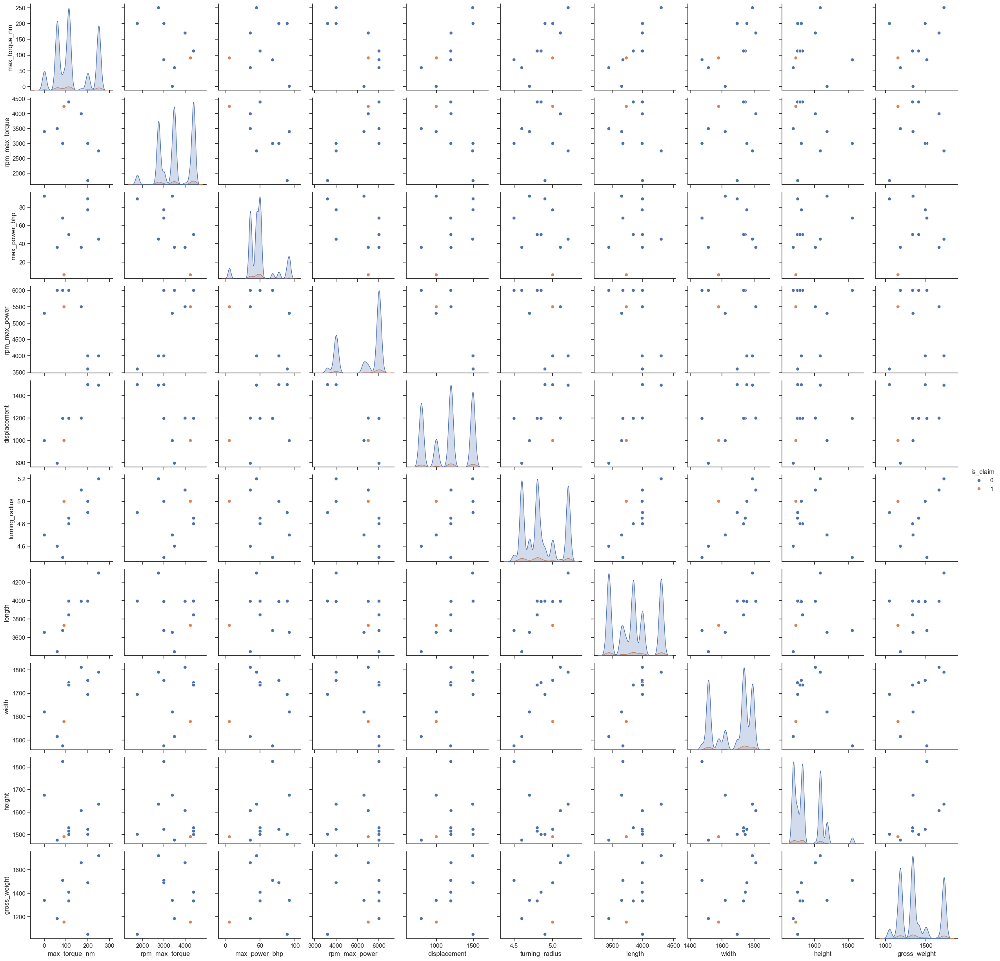

In [69]:
sns.set_theme(style="ticks")
sns.pairplot(df, hue="is_claim", vars=true_numeric)
plt.show()

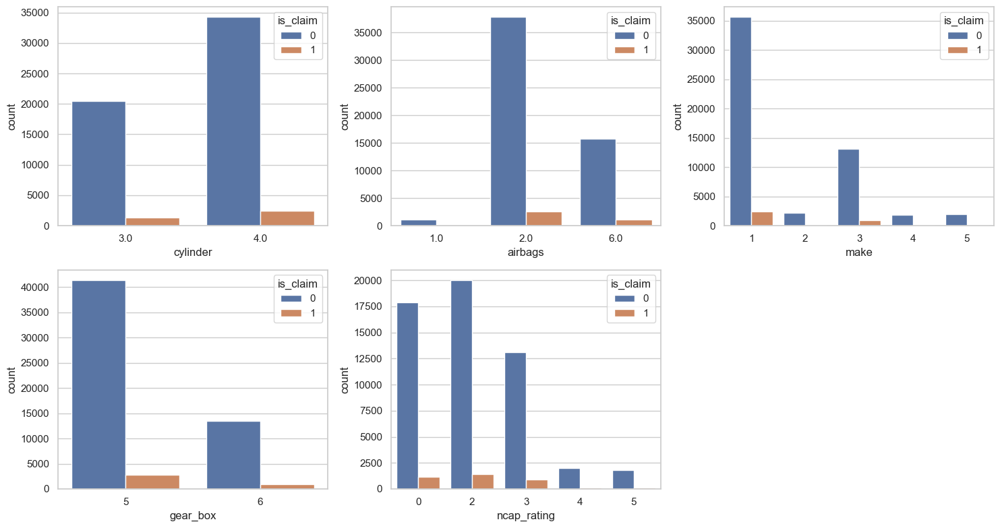

In [107]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,8))
axs = axs.flatten()
for i, column in enumerate(set(numeric)-set(true_numeric)):
    sns.countplot(df, x=column, hue="is_claim", ax=axs[i])
axs[-1].set_visible(False)
plt.tight_layout()
plt.show()

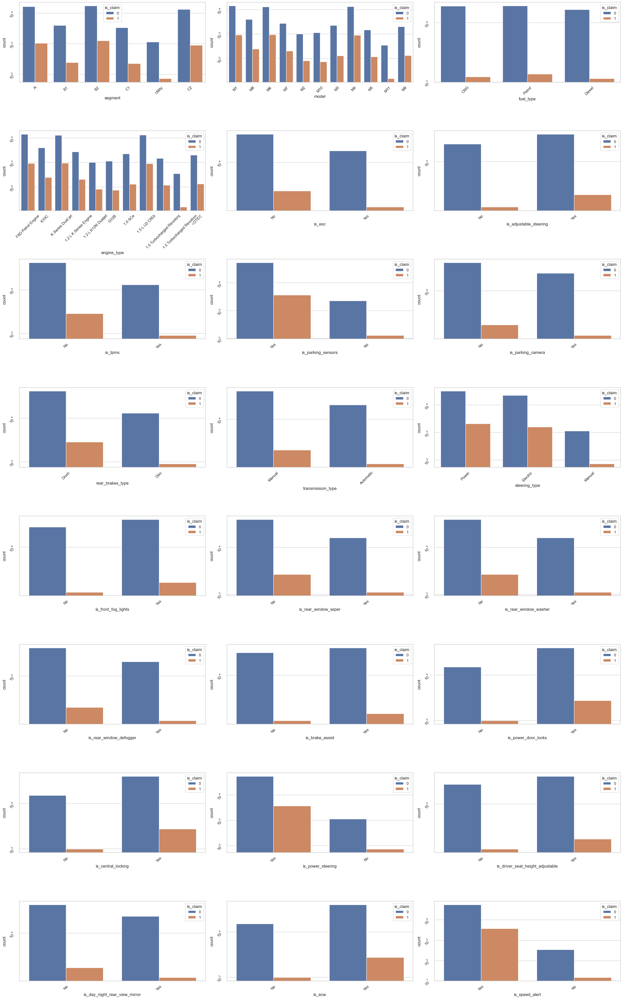

In [132]:
# Now let's analyse the non numeric columns of the dataset
fig, axs = plt.subplots(nrows=8, ncols=3, figsize=(25, 40))
axs= axs.flatten()
for i, column in enumerate(non_numeric):
    sns.countplot(df, x=column, hue="is_claim", ax=axs[i])
    axs[i].set_yscale("log")
    axs[i].tick_params(labelrotation=45)
plt.tight_layout()
plt.show()

Now let's create some new features

In [143]:
# Feature 1: Power to Weight Ratio
df['Power to Weight Ratio'] = df['max_power_bhp'] / df['gross_weight']

# Feature 2: Torque to Weight Ratio
df['Torque to Weight Ratio'] = df['max_torque_nm'] / df['gross_weight']

# Feature 3: Vehicle Size
df['Vehicle Size'] = df['length'] * df['width'] * df['height']

# Feature 4: Safety Features Count
safety_features = ['is_esc', 'is_tpms', 'is_parking_sensors', 'is_parking_camera', 'is_front_fog_lights', 'is_rear_window_wiper',
                   'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks', 'is_central_locking']
df['Safety Features Count'] = df[safety_features].map(lambda x: zero_one_dict[x]).sum(axis=1)

# Feature 5: Performance Index
df['Performance Index'] = (df['max_power_bhp'] + df['max_torque_nm']) / df['gross_weight']

# Feature 6: Engine Efficiency
df['Engine Efficiency'] = df['max_power_bhp'] / df['displacement']

# Additional feature: Aspect Ratio (Height to Length Ratio)
df['Aspect Ratio'] = df['height'] / df['length']

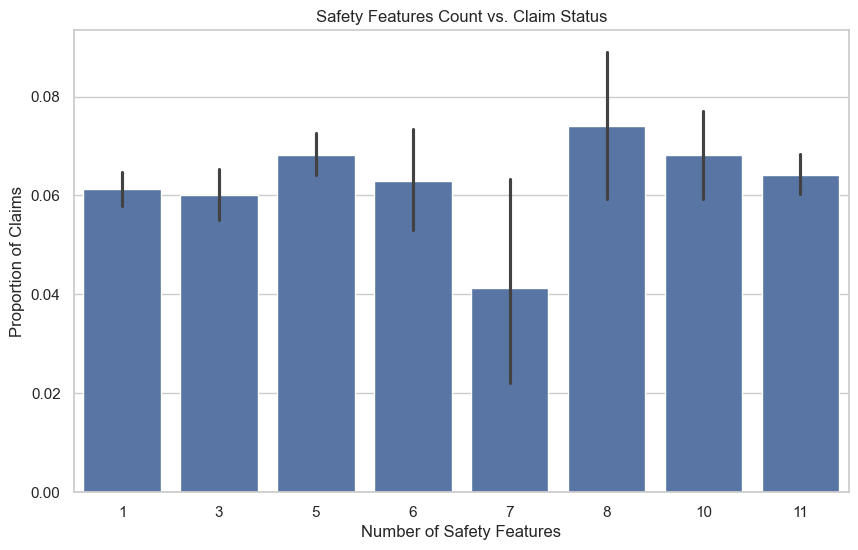

In [149]:
# Bar Plot for Categorical Feature (Safety Features Count)
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='Safety Features Count', y='is_claim', estimator=lambda x: sum(x) / len(x))  # Proportion of claims
plt.title('Safety Features Count vs. Claim Status')
plt.xlabel('Number of Safety Features')
plt.ylabel('Proportion of Claims')
plt.show()

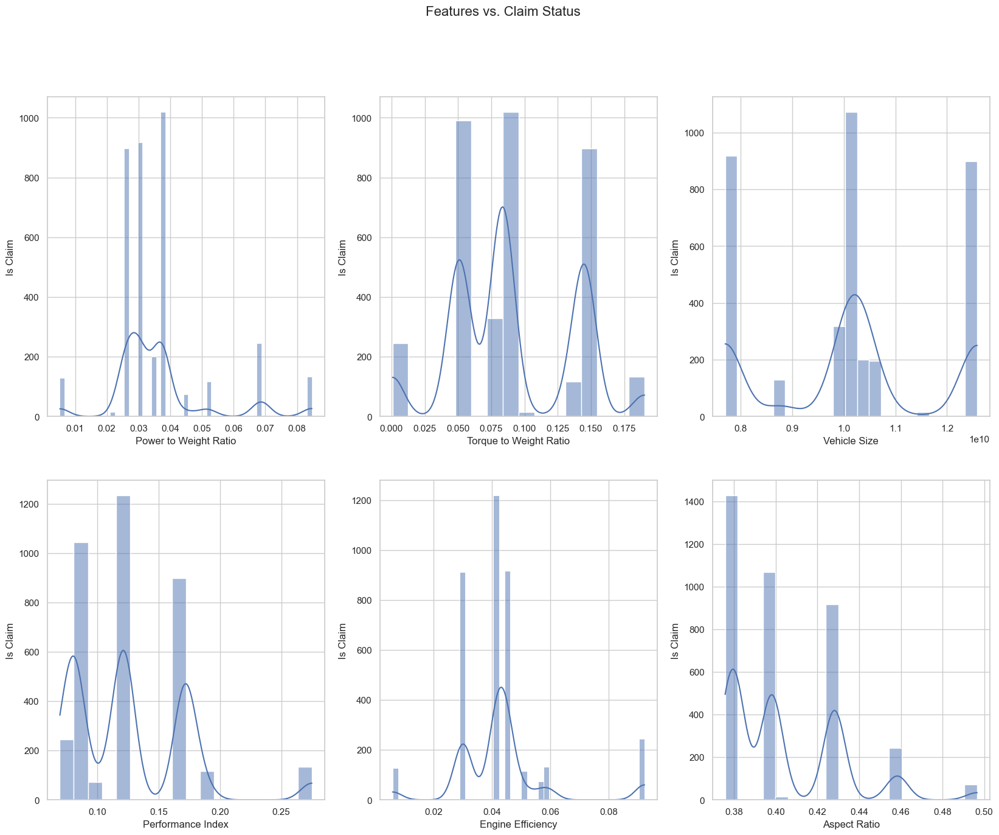

In [160]:
# Scatter Plot for Continuous Features
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 15))
axs = axs.flatten()
for i, feature in enumerate(['Power to Weight Ratio', 'Torque to Weight Ratio', 'Vehicle Size', 'Performance Index', 'Engine Efficiency', 'Aspect Ratio']):
    sns.histplot(data=df[df["is_claim"] == 1], x=feature, kde=True, ax=axs[i])
    axs[i].set_xlabel(feature)
    axs[i].set_ylabel('Is Claim')
fig.suptitle('Features vs. Claim Status', fontsize=16)  # Set the title for the entire figure
plt.show()

No information could be derived perfectly from the plots but they can be used in machine learning part well